In [ ]:
import pandas as pd
import numpy as np

from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error

from scipy.stats import norm
from scipy.optimize import brentq

import matplotlib.pyplot as plt
import seaborn as sns

from itertools import combinations

In [9]:
trades_day_2 = pd.read_csv('./p3_data/round5/trades_round_5_day_2.csv', sep=';')
trades_day_3 = pd.read_csv('./p3_data/round5/trades_round_5_day_3.csv', sep=';')
trades_day_4 = pd.read_csv('./p3_data/round5/trades_round_5_day_4.csv', sep=';')

prices_day_2 = pd.read_csv('./p3_data/round5/prices_round_5_day_2.csv', sep=';')
prices_day_3 = pd.read_csv('./p3_data/round5/prices_round_5_day_3.csv', sep=';')
prices_day_4 = pd.read_csv('./p3_data/round5/prices_round_5_day_4.csv', sep=';')

trades_day_2['timestamp'] += 2_000_000
trades_day_3['timestamp'] += 3_000_000
trades_day_4['timestamp'] += 4_000_000

prices_day_2['timestamp'] += 2_000_000
prices_day_3['timestamp'] += 3_000_000
prices_day_4['timestamp'] += 4_000_000

trades = pd.concat([trades_day_2, trades_day_3, trades_day_4])
prices = pd.concat([prices_day_2, prices_day_3, prices_day_4])

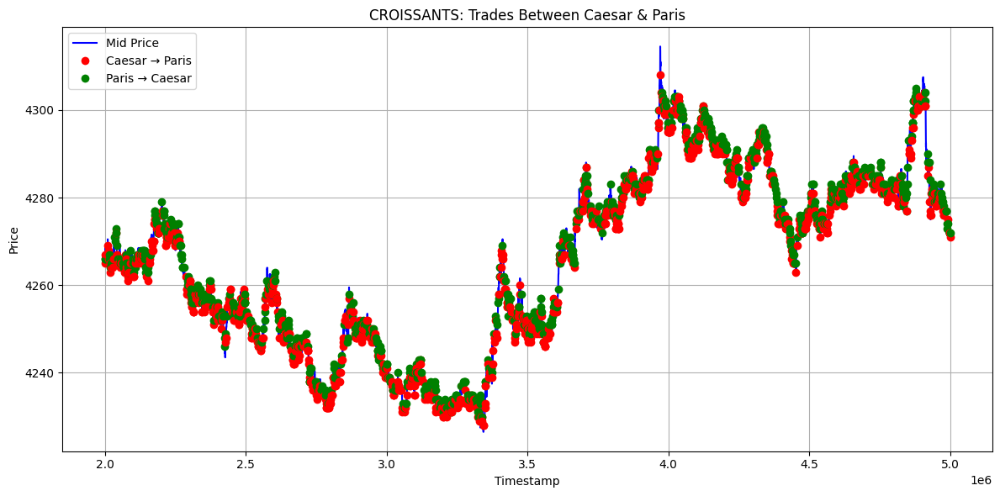

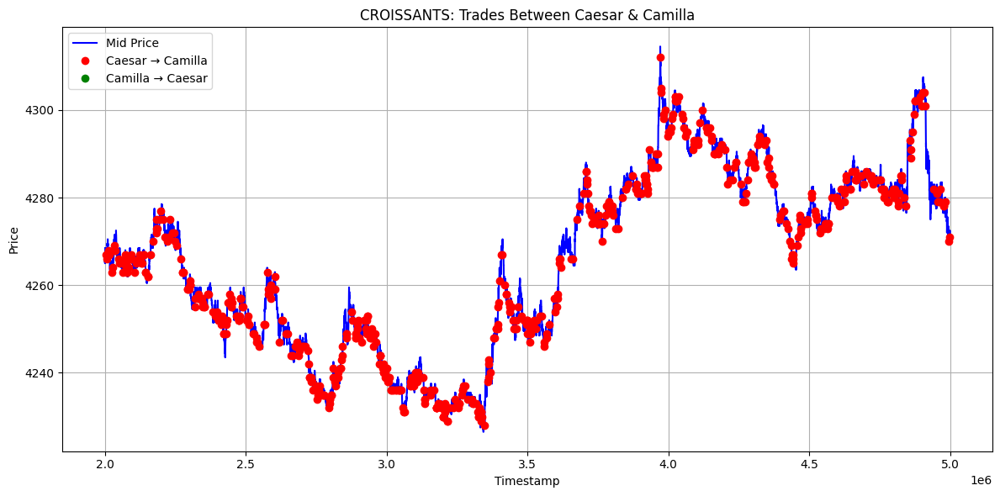

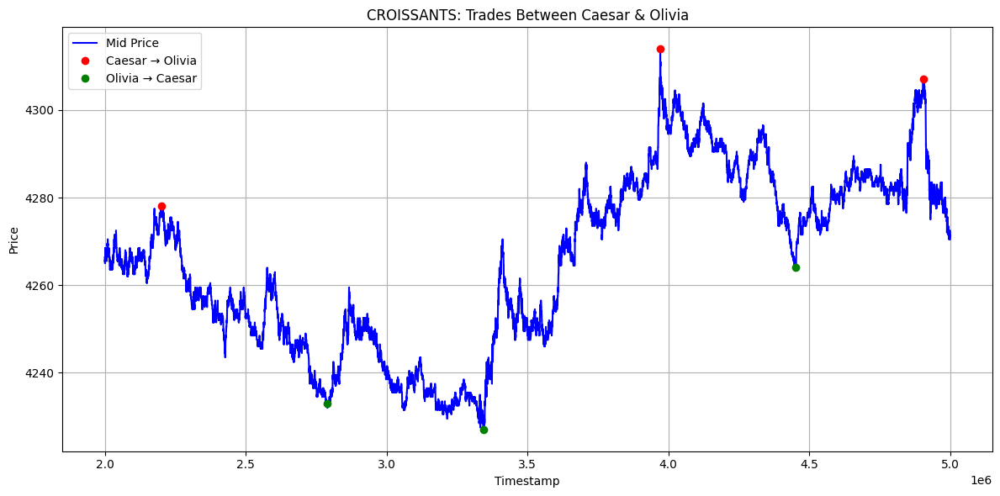

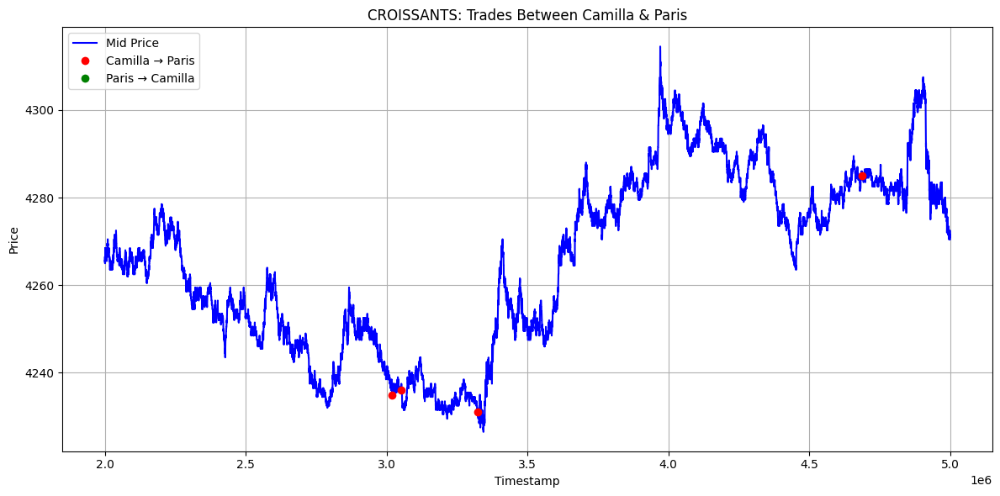

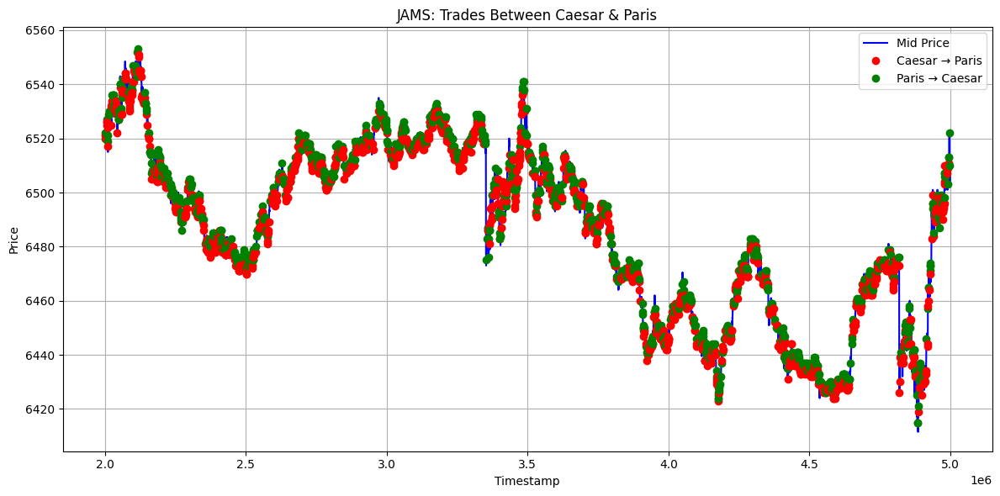

...

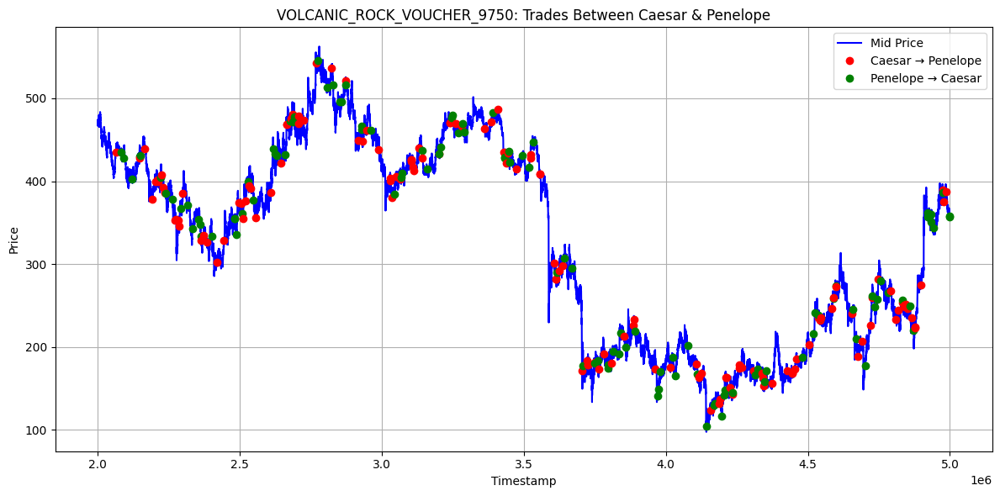

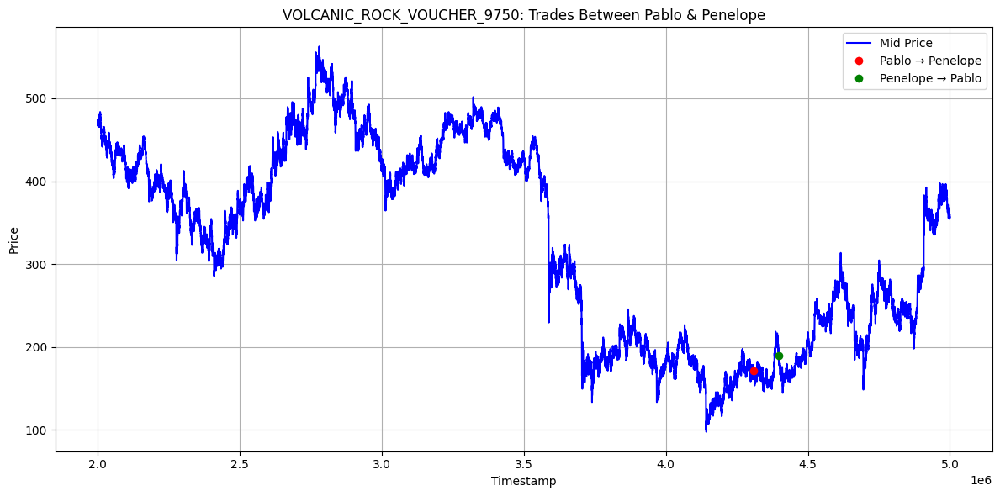

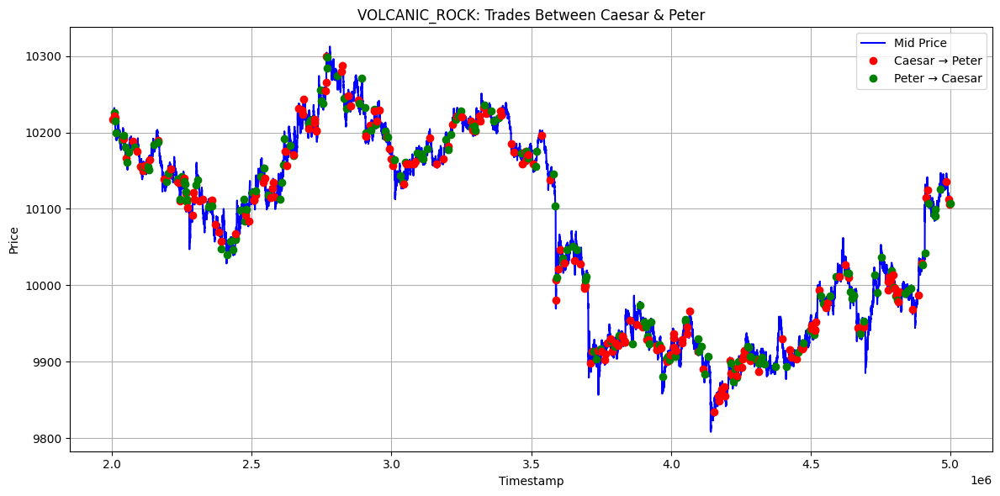

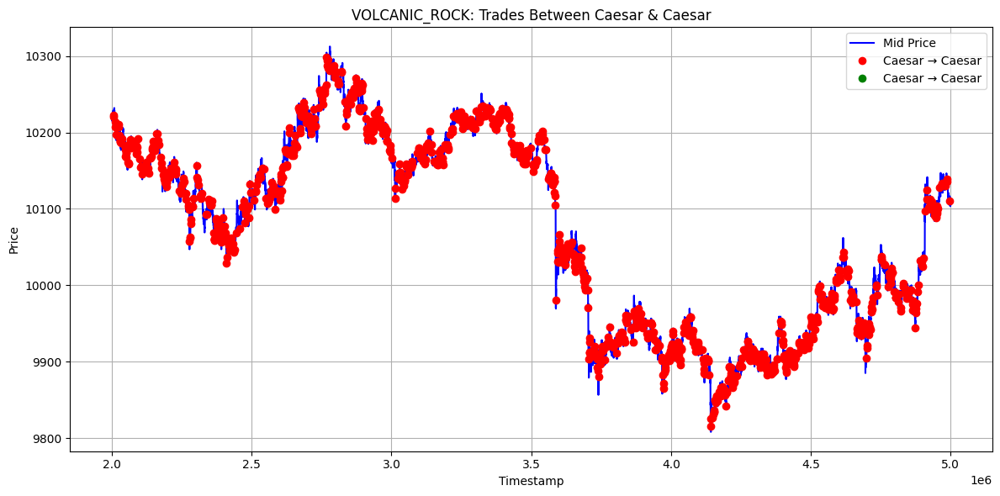

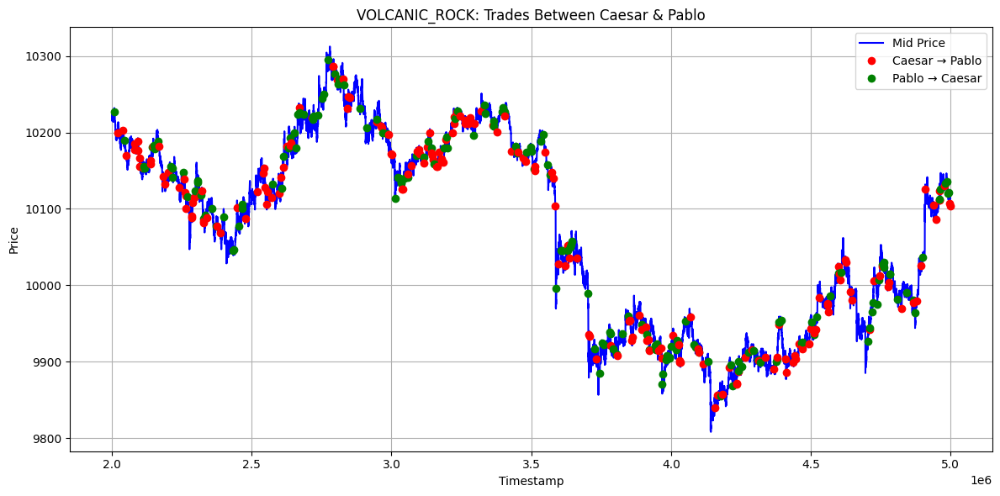

In [16]:
def get_pair(buyer, seller):
    return tuple(sorted([buyer, seller]))

symbols = trades['symbol'].unique()

for symbol in symbols:
    if symbol == "RAINFOREST_RESIN":
        continue  # Skip this symbol

    symbol_prices = prices[prices['product'] == symbol]
    symbol_trades = trades[trades['symbol'] == symbol].copy()
    
    symbol_trades['pair'] = symbol_trades.apply(lambda row: get_pair(row['buyer'], row['seller']), axis=1)
    unique_pairs = symbol_trades['pair'].unique()

    for pair in unique_pairs:
        pair_trades = symbol_trades[symbol_trades['pair'] == pair]

        plt.figure(figsize=(12, 6))
        plt.plot(symbol_prices['timestamp'], symbol_prices['mid_price'], label='Mid Price', color='blue')

        for _, row in pair_trades.iterrows():
            color = 'red' if row['buyer'] == pair[0] else 'green'
            plt.scatter(row['timestamp'], row['price'], color=color, zorder=5)

        plt.title(f"{symbol}: Trades Between {pair[0]} & {pair[1]}")
        plt.xlabel("Timestamp")
        plt.ylabel("Price")
        
        # Add custom legend
        from matplotlib.lines import Line2D
        custom_lines = [
            Line2D([0], [0], color='blue', label='Mid Price'),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='red', label=f'{pair[0]} → {pair[1]}', markersize=8),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='green', label=f'{pair[1]} → {pair[0]}', markersize=8)
        ]
        plt.legend(handles=custom_lines)

        plt.grid(True)
        plt.tight_layout()
        plt.show()